In [1]:
import os
import sys
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import skimage.io
import re
import cv2
import h5py
from tqdm.notebook import trange, tqdm
import napari
from skimage import img_as_ubyte
from skimage.color import rgb2hed, hed2rgb, rgb2gray
from skimage import exposure, util
import seaborn as sns
from skimage.segmentation import mark_boundaries
import pickle
import networkx as nx
from sklearn.neighbors import NearestNeighbors
from skimage import measure
from collections import defaultdict
from matplotlib.colors import ListedColormap
import napari
from cellpose import utils

In [2]:
cwd = Path(r'Y:\coskun-lab\Manali cases TNBC-immune')

In [3]:
paths = []
names = []
ROIs = []

for (dirpath, dirnames, filenames) in os.walk(cwd / 'cropped'):
    for name in filenames:
        path = os.path.join(dirpath, name)
        file = name.split('.')[0]
        
        paths.append(path)
        names.append(file.split('_')[0])
        ROIs.append(int(file.split('_')[1]))       
        
df = pd.DataFrame({'Name': names, 'ROI': ROIs, 'Path': paths})

In [4]:
df

,Name,ROI,Path
0,240584,0,Y:\coskun-lab\Manali cases TNBC-immune\cropped...
1,240584,1,Y:\coskun-lab\Manali cases TNBC-immune\cropped...
2,240584,2,Y:\coskun-lab\Manali cases TNBC-immune\cropped...
3,240584,3,Y:\coskun-lab\Manali cases TNBC-immune\cropped...
4,240584,4,Y:\coskun-lab\Manali cases TNBC-immune\cropped...
5,240585,0,Y:\coskun-lab\Manali cases TNBC-immune\cropped...
6,240585,1,Y:\coskun-lab\Manali cases TNBC-immune\cropped...
7,240585,2,Y:\coskun-lab\Manali cases TNBC-immune\cropped...
8,240586,0,Y:\coskun-lab\Manali cases TNBC-immune\cropped...
9,240586,1,Y:\coskun-lab\Manali cases TNBC-immune\cropped...


# Infiltration

In [5]:
def get_distances(cell_mask, r=65):
    # NN classifier
    neigh = NearestNeighbors(radius=r)
    
    # Get centroid of cellmask
    prop = measure.regionprops_table(cell_mask, properties=['label',"centroid"])
    X = np.column_stack((prop["centroid-0"], prop["centroid-1"]))
    
    # fit the k-NN classifier
    neigh.fit(X)
    distances, neighbors = neigh.radius_neighbors(X, return_distance=True, sort_results=True)
    graph = neigh.radius_neighbors_graph(X, mode='distance').toarray()
    return distances, neighbors, prop['label'], graph, X

def connectpoints(x,y,p1,p2):
    x1, x2 = x[p1], x[p2]
    y1, y2 = y[p1], y[p2]
    plt.plot([x1,x2],[y1,y2],"b-", color='red', alpha=1, lw=1, zorder=0)

def plot_nn(X, graph, node_colors, ax):
    G = nx.from_numpy_array(graph)
    pos = dict(zip(np.arange(len(X)), X[:,[1,0]]))
    nx.draw(G, pos, node_size=3, node_color=node_colors, edge_color='blue', linewidths=1, width=1,ax=ax)

def get_cell_color(cell_labels, tumor_cell, immune_cell, stroma_cell, rgb):
    cell_max_marker = {}
    cell_max_color = []
    for cell in cell_labels:
        if cell in tumor_cell:
            cell_max_marker[cell] = 0
            cell_max_color.append(rgb[0])
        elif cell in immune_cell:
            cell_max_marker[cell] = 1
            cell_max_color.append(rgb[1])
        elif cell in stroma_cell:
            cell_max_marker[cell] = 2
            cell_max_color.append(rgb[2])
    return cell_max_marker, cell_max_color

def replace_with_dict(ar, dic):
    dic[0] = np.nan
    
    # Extract out keys and values
    k = np.array(list(dic.keys()))
    v = np.array(list(dic.values()))

    # Get argsort indices
    sidx = k.argsort()

    ks = k[sidx]
    vs = v[sidx]
    return vs[np.searchsorted(ks,ar)]

def myround(x, base=5):
    return base * round(x/base)

In [86]:
from collections import defaultdict
from numpy.lib.stride_tricks import as_strided

def get_nei_info(cell_labels, neighbors, node_class, distances):
    node_nei_info = defaultdict(dict)
    for idx, node in enumerate(cell_labels):
        neighbor = neighbors[idx][1:]
        nei_class = np.array([node_class[cell_labels[n]] for n in neighbor])
        nei_distance = distances[idx][1:]   # First distance always correspond to 0 for item itself

        unique, counts = np.unique(nei_class, return_counts=True)
        for idx, c in enumerate(unique):
            node_nei_info[node][c] = {
                'count': counts[idx], 
                'avg_distance': np.mean(nei_distance[np.where(nei_class == c)])
            }
    return node_nei_info
                             
def get_node_patch(X, node_class, n):
    nodes = node_class.keys()
    patches = X//n
    return dict(zip(nodes, patches))

def tile_array(a, b0, b1):
    r, c = a.shape                                    # number of rows/columns
    rs, cs = a.strides                                # row/column strides 
    x = as_strided(a, (r, b0, c, b1), (rs, 0, cs, 0)) # view a as larger 4D array
    return x.reshape(r*b0, c*b1)                      # create new 2D array

def patch_count(c, node_class, node_patch, n, shape):
    matching_node = [k for k, v in node_class.items() if v == c]
    patch_shape = [d//n+1 if d%n>0 else d//n for d in shape]
    patch_matrix = np.zeros(patch_shape)
    for node in matching_node:
        i, j = node_patch[node]
        i = int(i)
        j = int(j)
        patch_matrix[i][j] += 1
    patch_matrix = patch_matrix
    return patch_matrix

def patch_count_neighbor(c1, c2, neighbor_class, node_class, node_patch, n, shape):
    patch_shape = [d//n+1 if d%n>0 else d//n for d in shape]
    patch_matrix = np.zeros(patch_shape)
    for node, neighbors in neighbor_class.items():
        if neighbors.get(c2) and node_class[node] == c1:
            i, j = node_patch[node]
            i = int(i)
            j = int(j)
            patch_matrix[i][j] += neighbors.get(c2)['count']
    patch_matrix = patch_matrix
    return patch_matrix

def count_neighbor(c1, c2, neighbor_class, node_class):
    count = 0
    for node, neighbors in neighbor_class.items():
        if neighbors.get(c2) and node_class[node] == c1:
            count += neighbors.get(c2)['count']
    return count

def plot_count_patch(node_class, node_patch, n, shape, path=None):
    patch_matrix = []
    for c in range(4):
        patch_matrix.append(patch_count(c, node_class, node_patch, n, shape))

    fig, axs = plt.subplots(2,2, figsize = (12,10))
    ax = axs.flatten()
    norm = plt.Normalize(vmin=np.min(patch_matrix),
                         vmax=np.max(patch_matrix))
    for c, ax in enumerate(ax):
        ax.axis('off')
        im = ax.imshow(patch_matrix[c], cmap = 'RdYlBu_r', norm=norm)
        ax.title.set_text(labels[c])
    fig.subplots_adjust(hspace=0.1, wspace=0.01)
    cbar = fig.colorbar(im, ax=axs, shrink=0.5)
    cbar.set_label('Count')
    if path:
         fig.savefig(path, bbox_inches='tight')
    
def plot_interaction_patch(init_c, node_class, node_patch, n, shape, cmap, path=None):
    init_c = 0
    patch_matrix = []
    for c in range(4):
        patch_matrix.append(patch_count_neighbor(init_c, c, neighbor_class, node_patch, n, shape))

    fig, axs = plt.subplots(2,2, figsize = (12,10))
    ax = axs.flatten()
    norm = plt.Normalize(vmin=np.min(patch_matrix),
                         vmax=np.max(patch_matrix))
    for c, ax in enumerate(ax):
        ax.axis('off')
        im = ax.imshow(patch_matrix[c], cmap = cmap, norm=norm)
        ax.title.set_text(labels[c])
    fig.subplots_adjust(hspace=0.1, wspace=0.01)
    cbar = fig.colorbar(im, ax=axs, shrink=0.5)
    cbar.set_label('Count')
    if path:
         fig.savefig(path, bbox_inches='tight')

In [87]:
os.add_dll_directory(r'C:\Users\thu71\Downloads\openslide-win64-20171122\bin')
import openslide
from skimage.transform import resize, rescale
from matplotlib.colors import ListedColormap
from skimage import img_as_bool
from skimage.measure import label, regionprops

def svs_mask_path(tcga_tag):
    for (dirpath, dirnames, filenames) in os.walk(cwd / 'svs'):
        for name in filenames:
            if tcga_tag in name:
                return os.path.join(dirpath, name)
            
def broadcast_tile(a, h, w):
    x, y = a.shape
    m, n = x * h, y * w
    return np.broadcast_to(
        a.reshape(x, 1, y, 1), (x, h, y, w)
    ).reshape(m, n)


In [91]:
rgb = np.array([[255,0,0], [0,255,0], [255,255,0]])/255
mycmap = ListedColormap(rgb)
n = 150
P_tumors = []
P_immunes = []
imgs = []
masks_region = []

for row in df.itertuples():
    name = row.Name
    ROI = row.ROI
    path = row.Path
    with open(cwd / 'cell_classification' / f"{name}_{ROI}.pickle", "rb") as f:
        mask_lymph, mask_tumor, mask_stroma = pickle.load(f)
    
    # Read img and mask
    img = skimage.io.imread(path)
    img = img_as_ubyte(img)
    
    mask_region_path = cwd / 'masks' / f"{name}_{ROI}.tiff"
    masks_region.append(skimage.io.imread(mask_region_path))
    
    assert img.shape[:2] == mask_lymph.shape
    assert img.shape[:2] == mask_tumor.shape
    
    imgs.append(img)
    
    cell_mask = np.zeros(mask_lymph.shape, dtype=np.int32)
    np.putmask(cell_mask, mask_lymph, mask_lymph)
    np.putmask(cell_mask, mask_tumor, mask_tumor)
    np.putmask(cell_mask, mask_stroma, mask_stroma)
    
    tumor_cell = np.unique(mask_tumor)[1:]
    immune_cell = np.unique(mask_lymph)[1:]
    stroma_cell = np.unique(mask_stroma)[1:]
    
    # Get cell neighbors analysis
    distances, neighbors, cell_labels, graph, X = get_distances(cell_mask)
    
    node_class, node_colors = get_cell_color(cell_labels, tumor_cell, immune_cell, stroma_cell, rgb)
    neighbor_class = get_nei_info(cell_labels, neighbors, node_class, distances)
    node_patch = get_node_patch(X, node_class, n)
    

    tumor = patch_count(0, node_class, node_patch, n, cell_mask.shape)
    immune = patch_count(1, node_class, node_patch, n, cell_mask.shape)

    total = [patch_count(i, node_class, node_patch, n, cell_mask.shape)  for i in range(3)]
    total = np.sum(total, axis=(0))
    P_tumor = np.divide(tumor, total, out=np.zeros_like(total), where=total!=0)
    P_immune = np.divide(immune, total, out=np.zeros_like(total), where=total!=0)
    
    P_tumors.append(P_tumor)
    # P_immunes.append(P_immune)
    
    ip_t_int = patch_count_neighbor(1, 0, neighbor_class, node_class, node_patch, n, cell_mask.shape)
    ip_t_int2 = patch_count_neighbor(0, 1, neighbor_class, node_class, node_patch, n, cell_mask.shape)
    ip_int_total = [patch_count_neighbor(i, j, neighbor_class, node_class, node_patch, n, cell_mask.shape) for i in range(3) for j in range(3)]
    ip_int_total = np.sum(ip_int_total, axis=(0))
    P_ip_t = np.divide(ip_t_int+ip_t_int2, np.max(ip_int_total), out=np.zeros_like(ip_int_total), where=ip_int_total!=0)
    P_immunes.append(P_ip_t)
    
    plt.show()

In [92]:
# # Mark boundaries
# img_bd = mark_boundaries(img, mask_lymph, color=(0,1,0), mode='thick')
# img_bd = mark_boundaries(img_bd, mask_stroma, color=(1,1,0), mode='thick')
# img_bd = mark_boundaries(img_bd, mask_tumor, color=(1,0,0), mode='thick')

# viewer = napari.view_image(img_bd)

C:\Users\thu71\AppData\Local\Temp/ipykernel_71832/3876018283.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1,2, dpi=200)


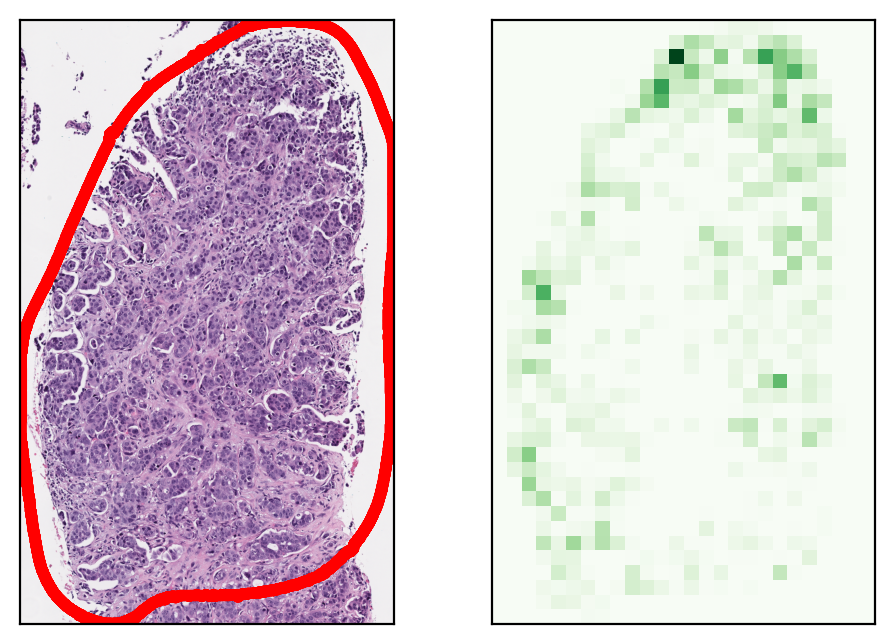

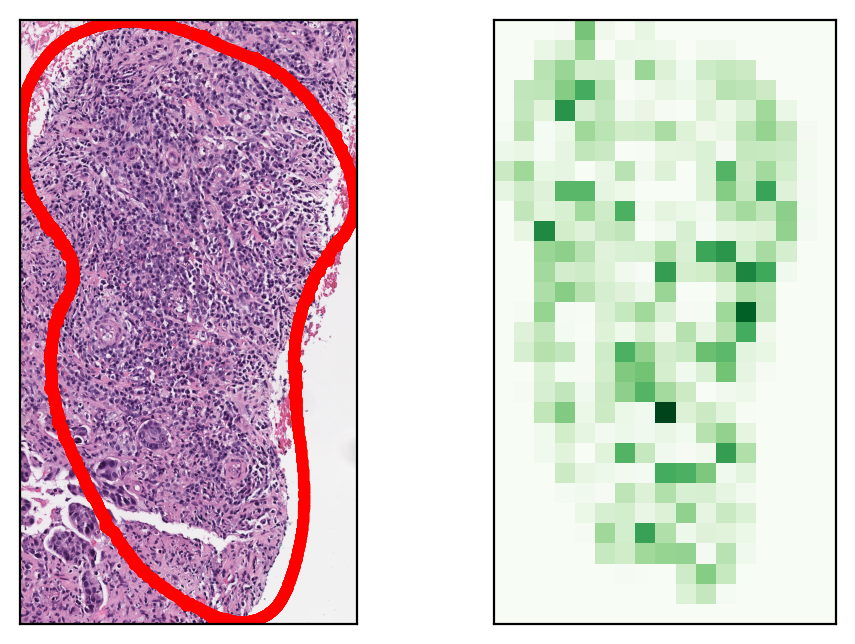

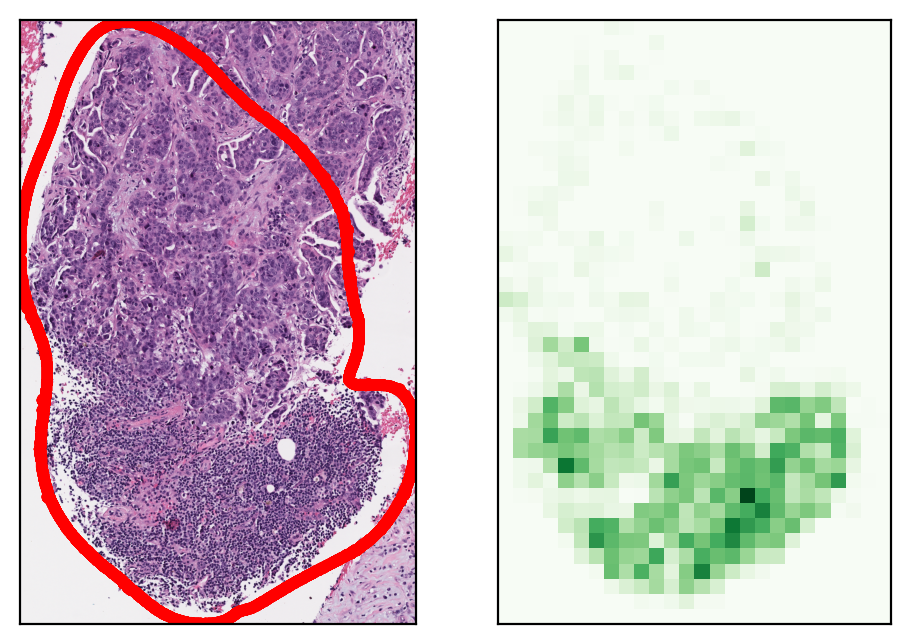

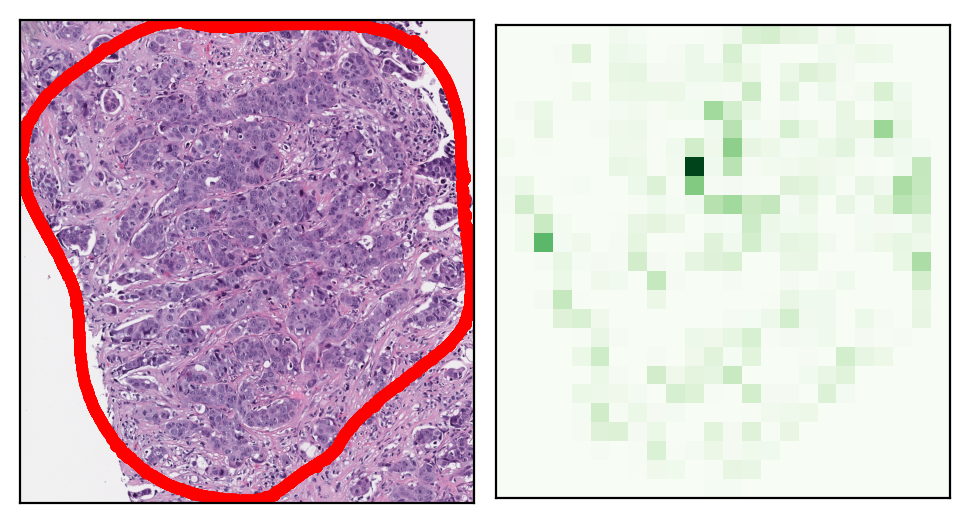

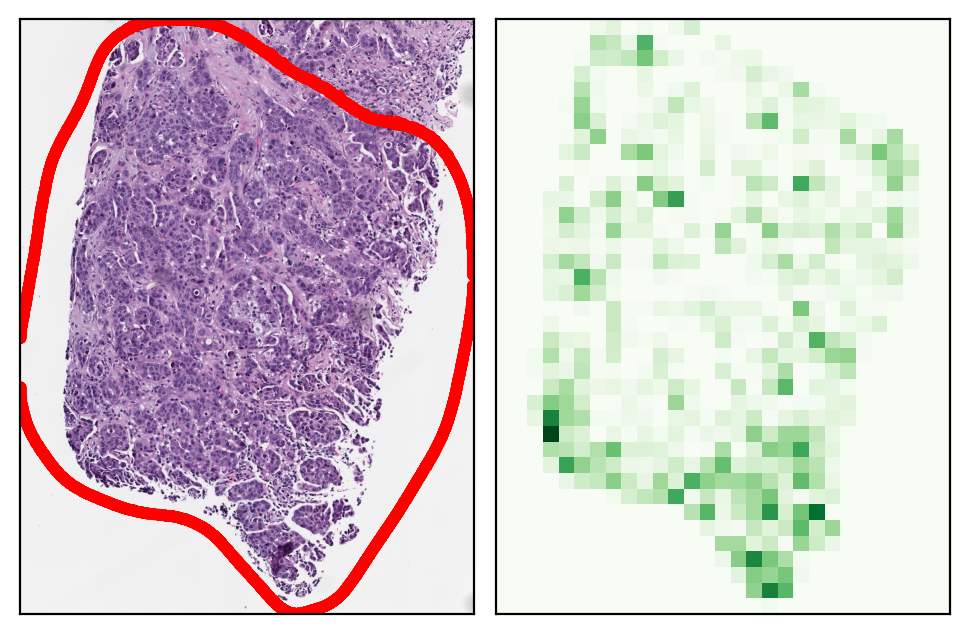

...

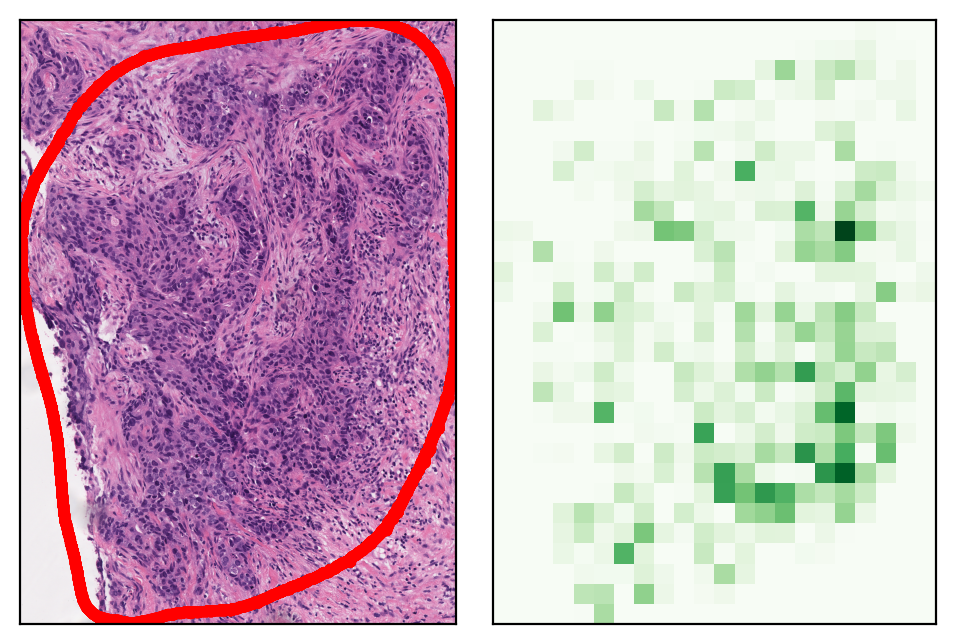

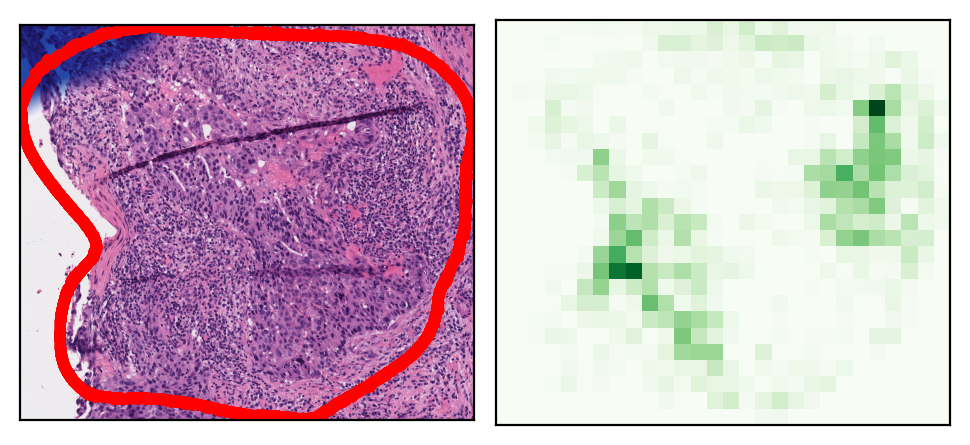

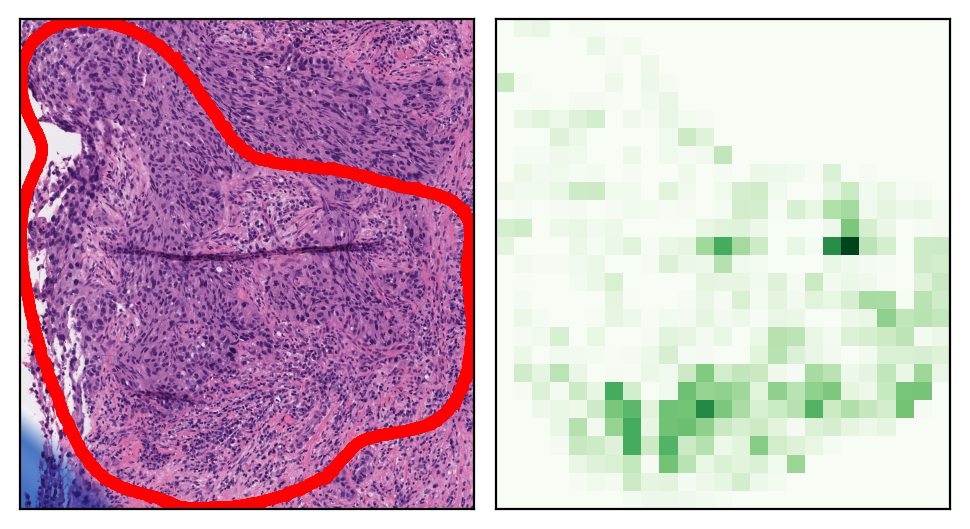

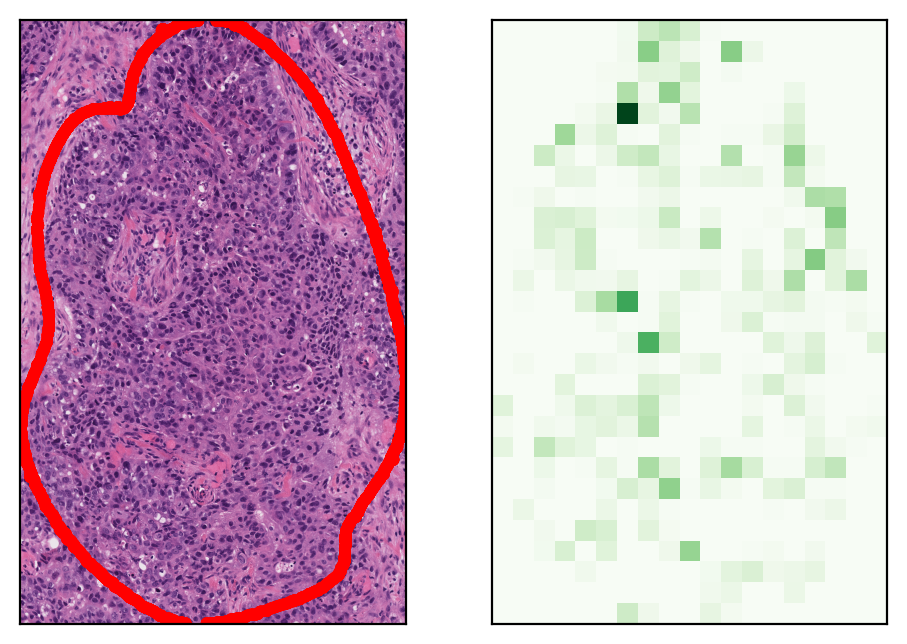

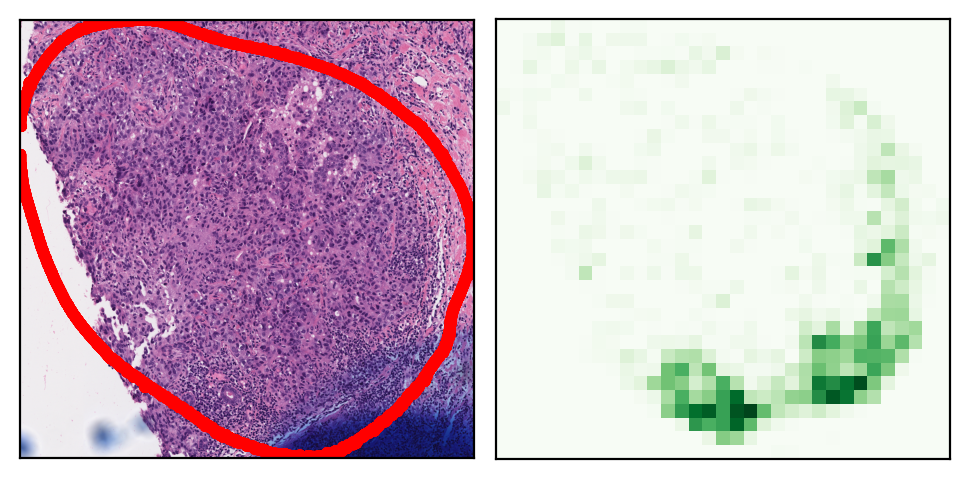

In [103]:
from skimage import segmentation

colors = np.array([[0, 0, 0, 1],[0, 0, 1, 1],[1, 0, 0, 1]])
mycmp = ListedColormap(colors)

for i, img in enumerate(imgs):
    fig, ax = plt.subplots(1,2, dpi=200)
    ax[0].imshow(img)
    ax[0].contour(masks_region[i], colors='red', linewidths=4)
    ax[0].tick_params(axis=u'both', which=u'both',length=0, labelbottom=False, labelleft=False)
    
    ax[1].imshow( np.multiply(P_immunes[i], P_tumors[i]), cmap='Greens')
    ax[1].tick_params(axis=u'both', which=u'both',length=0, labelbottom=False, labelleft=False)
    
    fig.subplots_adjust(wspace=0.05)


In [102]:
P_immunes_mean = [np.mean(P) for P in P_immunes]
P_tumors_mean = [np.mean(P) for P in P_tumors]
P_immunes_mean = np.multiply(P_immunes_mean, P_tumors_mean)

# P_immunes_mean = [np.mean(np.multiply(P1, P2)) for P1,P2 in zip(P_immunes,P_tumors)]

name = df.Name.tolist()
response = ['Responder' if n in ['240568', '240587', '240608'] else 'Non responder' for n in name]

df_response = pd.DataFrame({'Response': response, 'Name': name, 'Score': P_immunes_mean})

Non responder vs. Responder: Mann-Whitney-Wilcoxon test two-sided, P_val:1.403e-01 U_stat=3.100e+01


(<AxesSubplot:xlabel='Response', ylabel='Score'>,
 [<statannotations.Annotation.Annotation at 0x1d40e9ba460>])

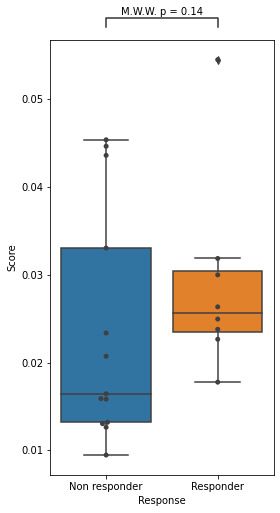

In [101]:
from statannotations.Annotator import Annotator

fig, ax = plt.subplots(figsize=(4,8))
ax = sns.boxplot(data= df_response, x='Response', y='Score', ax=ax)
ax = sns.swarmplot(data= df_response, x='Response', y='Score', ax=ax, color=".25")

pairs=[("Responder", 'Non responder')]

annotator = Annotator(ax, pairs, data= df_response, x='Response', y='Score')
annotator.configure(test='Mann-Whitney', text_format='simple', loc='outside')
annotator.apply_and_annotate()